<a href="https://colab.research.google.com/github/hjkornn-phys/Aiffel-new-to-git/blob/master/Exploration_5/EX5_Who_is_closest_to_me.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 나와 가장 가까운 연예인은?

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


최근 마스크를 쓰고 찍은 사진밖에 존재하지 않아, 류현진과 닮은 연예인을 찾는 것으로 목표를 변경한다.

In [2]:
# 한글폰트 깨짐 해결
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 40 not upgraded.
Need to get 9,604 kB of archives.
After this operation, 29.5 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-nanum all 20170925-1 [9,604 kB]
Fetched 9,604 kB in 2s (5,764 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 160837 files and d

## 이미지 파일 불러오기

이미지 파일 개수: 282


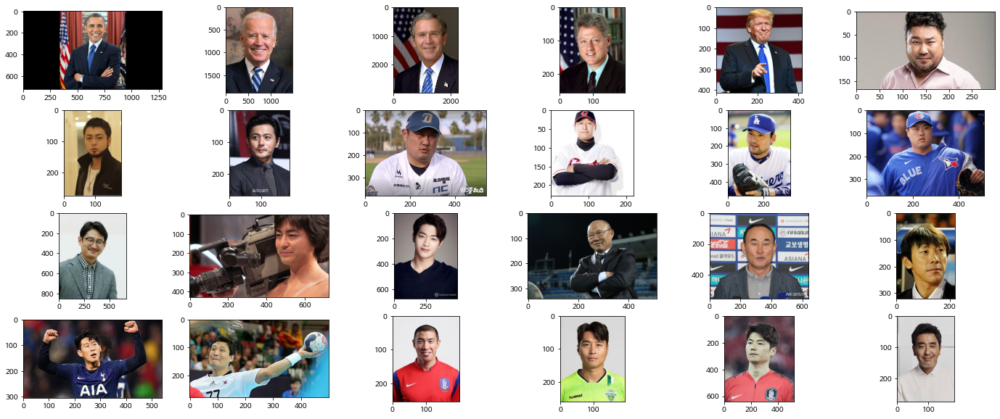

In [4]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as img
from unicodedata import normalize


plt.rc('font', family='NanumBarunGothic') 
dir_path = '/content/drive/MyDrive/AIffel2021/Ex05-FaceSimilarity/celebrity'
# 한글 파일을 제대로 읽어내 후에 embedding dict에 저장할 수 있으나,
# 한글로 된 key로는 해당 value에 접근할 수 없어 NFD(colab default)에서 NFC로
# 변환하는 함수를 만든다

def list_files(dir_path):
    nfd_file_list = os.listdir(dir_path)

    file_list = []
    for nfd_file in nfd_file_list:
        file = normalize("NFC", nfd_file)
        file_list.append(file)
    return file_list

file_list = list_files(dir_path)
print(f'이미지 파일 개수: {len(file_list)}')


#Set figsize here
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(24,10))

# flatten axes for easy iterating
for i, ax in enumerate(axes.flatten()):
  img_path = os.path.join(dir_path, file_list[i])
  image = img.imread(img_path)
  ax.imshow(image)
plt.show()

fig.tight_layout()


In [5]:
# 한글이 제대로 인식되는지 확인한다
file_list[5] == '고창석.jpeg'

True

In [6]:
mapping = {}
for file in file_list:
    mapping[file.split('.')[0]] = file
# mapping

## 얼굴 잘라내기

In [7]:
!pip install dlib
!pip install face_recognition

     |████████████████████████████████| 100.1 MB 9.0 kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566184 sha256=d2b7cefd3eae6e9e662da0005610608ce0f54a718c0eebd970d89362c16a466f
  Stored in directory: /root/.cache/pip/wheels/d6/81/3c/884bcd5e1c120ff548d57c2ecc9ebf3281c9a6f7c0e7e7947a
Successfully built face-recognition-models


[(47, 179, 121, 104)]


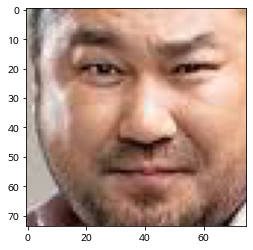

In [8]:
import face_recognition
%matplotlib inline
import matplotlib.pyplot as plt


image_path = '/content/drive/MyDrive/AIffel2021/Ex05-FaceSimilarity/celebrity/고창석.jpeg'
image = face_recognition.load_image_file(image_path)
face_locations = face_recognition.face_locations(image)

print(face_locations)  # 이미지에서 얼굴 영역의 좌표를 출력합니다.

a, b, c, d = face_locations[0]
cropped_face = image[a:c,d:b,:]

plt.imshow(cropped_face)   # 이미지에서 얼굴영역만 잘라낸 cropped_face를 그려 봅니다.

In [9]:
# 얼굴을 자르는 함수를 만든다
def get_cropped_face(image_path):
    """
    image_path: 한 명의 얼굴이 포함된 사진의 경로
    잘린 얼굴 부분을 반환한다. 얼굴을 인식하지 못했다면 None을 반환
    """
    img = face_recognition.load_image_file(image_path)
    face_locations = face_recognition.face_locations(img)
    if face_locations:
        a, b, c, d = face_locations[0]
        cropped_face = img[a:c, d:b, :]
        return cropped_face

## 임베딩 구하기

In [10]:
# 잘린 얼굴 영역에서 임베딩 벡터를 추출하는 함수를 만든다
def get_face_embedding(face):
    """
    face_recognition에서 pretrained 모델로 얼굴 영역에서 128차원 임베딩 벡터를 반환한다
    """
    return face_recognition.face_encodings(face)

In [11]:
image_file = os.path.join(dir_path, '기성용.jpg')
face = get_cropped_face(image_file)

embedding = get_face_embedding(face)
len(embedding[0])

128

In [12]:
# file_list에서 파일명을 key로 하고 
# embedding을 value로 하는 딕셔너리를 만든다
import numpy as np


def get_face_embedding_dict(dir_path):
    """
    dir_path에 있는 모든 파일(file_list)에 대해 얼굴 영역을 자르고
    임베딩 벡터를 구해 파일명과 임베딩벡터를 각각 key, value 로 하는 딕셔너리를 반환한다.
    얼굴인식을 하지 못하는 경우와 embedding이 빈 리스트로 나오는 경우에 대해 예외로 처리한다
    """
    file_list = list_files(dir_path)
    embedding_dict = {}
      
    for file in file_list:
        face = get_cropped_face(os.path.join(dir_path,file))
        if face is None: continue
        embedding = get_face_embedding(face)
        if not embedding: continue  #신태용
        embedding_dict[file.split('.')[0]] = np.array(embedding)  # - 연산을 할 수 있도록 numpy array로 변환한다
        
    print(f"이미지 파일 수: {len(file_list)}.\n처리된 이미지 파일 수: {len(embedding_dict)}.")
    return embedding_dict


In [13]:
# 임베딩 딕셔너리를 생성한다.
embedding_dict = get_face_embedding_dict(dir_path)

이미지 파일 수: 282.
처리된 이미지 파일 수: 273.


### 임베딩 간 거리 구하기

In [14]:
def get_distance(name1, name2):
    return np.linalg.norm(embedding_dict[name1]-embedding_dict[name2], ord=2)

In [ ]:
get_distance('기성용', '고창석')

0.6103959694846924

## 종합하여 거리 순으로 나열하기

In [15]:
# name1과 name2의 거리를 비교하는 함수를 생성하되, name1은 미리 지정하고, name2는 호출시에 인자로 받도록 합니다.
def get_sort_key_func(name1):
    def get_distance_from_name1(name2):
        return get_distance(name1, name2)
    return get_distance_from_name1

In [ ]:
sort_key_func = get_sort_key_func('trump')   
print(sort_key_func('obama'))

0.888511807112004


In [16]:
def get_nearest_face(name, top=5):
    near_faces = []
    sort_name_func = get_sort_key_func(name)
    sorted_list = sorted(embedding_dict.keys(), key=lambda x: sort_name_func(x))
    for idx, name in enumerate(sorted_list, start=1):
        if idx > 1:
            near_faces.append((name, sort_name_func(name)))
        if idx > top: 
            return near_faces

In [ ]:
ki = get_nearest_face('기성용', 10)
ki

[('김광현', 0.41865789559498734),
 ('주호민', 0.4472771165707904),
 ('손흥민', 0.45344502194348557),
 ('이대형', 0.4611505235840655),
 ('박재범', 0.46399185107472096),
 ('노무현', 0.4648486099170973),
 ('김민재', 0.4714529865225022),
 ('영알남', 0.4738216198279995),
 ('문재인', 0.47415680647153474),
 ('박완규', 0.4794865787010648)]

In [ ]:
mapping[ki[3][0]] # 미리 이름과 파일명을 딕셔너리로 대응시켜 놓았다.

'이대형.jpg'

In [ ]:
def plot_closest_draft(leaderboard):
    #Set figsize here
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24,10))

    # flatten axes for easy iterating
    for i, ax in enumerate(axes.flatten()):
        image = mapping[leaderboard[i][0]]
        image_path = img.imread(os.path.join(dir_path, image),0)  # png
        ax.imshow(image_path)
    plt.show()

    fig.tight_layout()

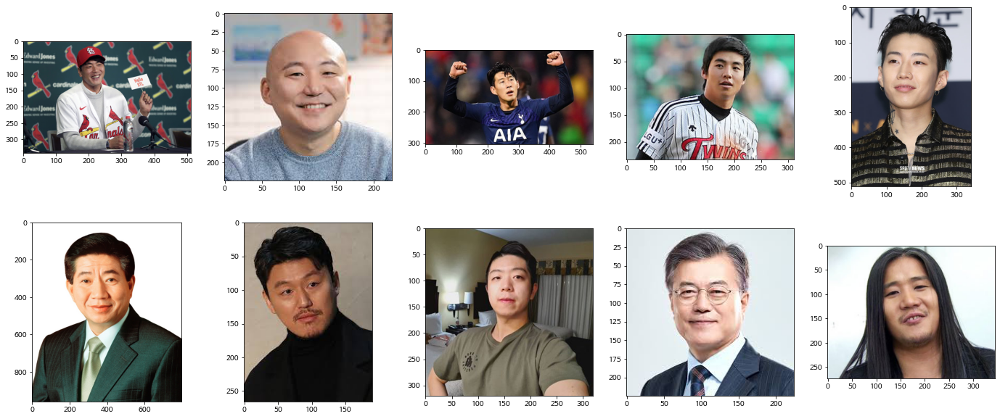

In [ ]:
plot_closest_draft(ki)

## 랜덤하게 나타나는 3개의 이미지 중 가장 가깝거나(먼) 이미지를 라운드 수에 따라 고르고, 최종적으로 가장 가까운(먼) 10명을 보여주는 게임을 설계해 본다

In [20]:
# 먼 이미지를 골라내기 위해 closest라는 키워드 인자를 추가한다. closest가 False이면 "먼" 이라는 문자열
# 과 key에 거리에 -1을 곱한 것이 기준이 되어 가장 먼 사람이 앞에 오게 된다.
def get_nearest_face_mod(name, top=5, *, closest=True):
    near_faces = []
    sort_name_func = get_sort_key_func(name)
    if closest:
        sorted_list = sorted(embedding_dict.keys(), key=lambda x: sort_name_func(x))
    else:
        sorted_list = sorted(embedding_dict.keys(), key=lambda x: -sort_name_func(x))
     
    for idx, name in enumerate(sorted_list, start=1):
        if idx > 1:
            near_faces.append((name, sort_name_func(name)))
        if idx > top: 
            return near_faces

In [ ]:
# x, y축 틱을 없애고, 이름을 표시합니다.
def plot_closest_mod(leaderboard, title):
    #Set figsize here
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24,10))


    # flatten axes for easy iterating
    for i, ax in enumerate(axes.flatten()):
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])
        ax.set_xlabel(leaderboard[i])
        image = mapping[leaderboard[i][0]]
        image_path = img.imread(os.path.join(dir_path, image),0)  # png
        ax.imshow(image_path)

    plt.suptitle(f"{title[0]}과 {title[1]} 상위 10명", fontweight="bold")
    plt.show()
    fig.tight_layout()

In [ ]:
from time import sleep

class GuessingGame():
    def __init__(self, name, *, rounds=8, closest=True):
        self.__cand_list = None
        self.__rank = None
        self.__point = None

        self.closest = closest
        self.name = name
        self.filename = mapping[name]
        self.rounds = rounds
        mode_list = ["먼", "가까운"]
        self.mode = mode_list[closest]
        
        fig_0, ax_0 = plt.subplots(figsize=(4,5))
        ax_0.axes.xaxis.set_ticks([])
        ax_0.axes.yaxis.set_ticks([])
        plt.xlabel(name)

        
        image_path = img.imread(os.path.join(dir_path, self.filename),0)  # png
        ax_0.imshow(image_path)
        print(f"{name}과 {self.mode} 사람 맞추기 게임이 준비되었습니다. ({rounds} 라운드)")
        print("시작하시려면 .play()를 실행하세요")
        self.earn_point()

    def play(self):
        self.set_val()

        print(f"게임 시작")
        for i in range(1, self.rounds+1):
            fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12,5))
            candidates = self.get_val(i)
            for j, ax in enumerate(axes.flatten()):
                ax.axes.xaxis.set_ticks([])
                ax.axes.yaxis.set_ticks([])
                ax.set_xlabel(f"{candidates[j][0]}")
                img_path = mapping[candidates[j][0]]
                image_path = img.imread(os.path.join(dir_path, img_path),0)  # png
                ax.imshow(image_path)
            plt.suptitle(f"라운드 {i}: 3명 중 가장 {self.name}과 {self.mode} 사람을 골라주세요.", fontweight="bold")
            plt.show()
            sleep(8)
            
            picked = input("정답이라고 생각되는 이름을 정확히 입력해주세요.")
            correct = sorted(candidates, key=lambda candidates: -candidates[1])[0][0]
            if picked == correct:
                print("정답입니다. 포인트 1점을 얻으셨습니다.")
                self.earn_point()
                print(f"현재 포인트: {self.__point}.")
            else: 
                print(f"오답입니다... 정답: {correct}")

        # 게임 끝
        print(f'게임이 끝났습니다. 최종 스코어는 {self.__point}점 입니다')
        plot_closest_mod(self.__leaderboard, (self.name, self.mode))
        
    def set_val(self):
        self.__cand_list = np.random.randint(1, 201 , (self.rounds,3))
        self.__rank = get_nearest_face_mod(name=self.name, top=200, closest=self.closest)
        self.__leaderboard = self.__rank[:10]

    def get_val(self, cur_round):
        cands = []
        for i in range(3):
            cands.append(self.__rank[self.__cand_list[cur_round-1][i]])
        return cands

    def earn_point(self):
        if self.__point == None:
            self.__point = 0
        else:
            self.__point += 1
    




기성용과 가까운 사람 맞추기 게임이 준비되었습니다. (8 라운드)
시작하시려면 .play()를 실행하세요


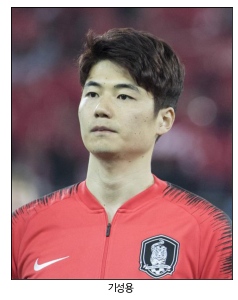

In [ ]:
game_ki = GuessingGame('기성용')

게임 시작


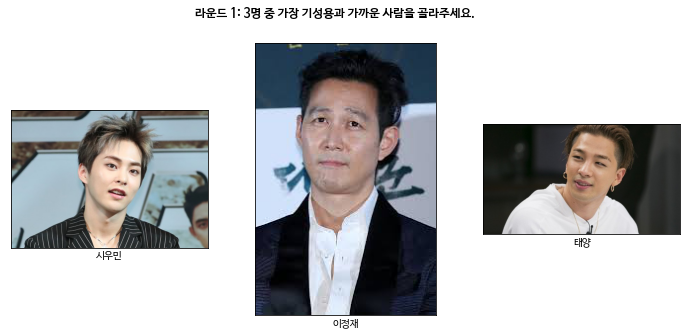

정답이라고 생각되는 이름을 정확히 입력해주세요.이정재
오답입니다... 정답: 시우민


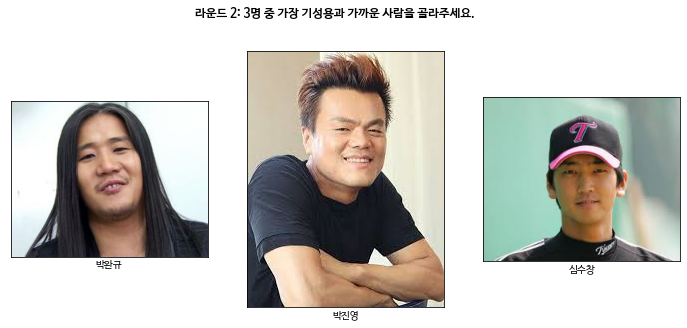

정답이라고 생각되는 이름을 정확히 입력해주세요.박진영
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 1.


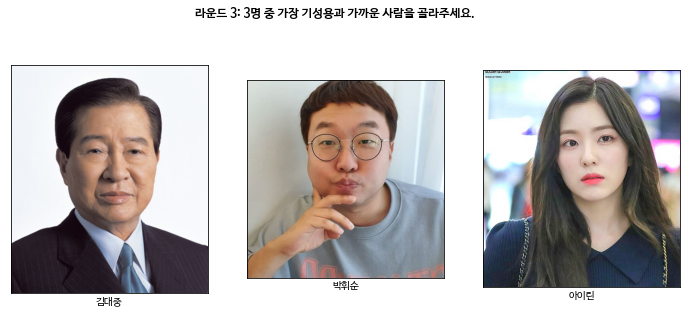

정답이라고 생각되는 이름을 정확히 입력해주세요.아이린
오답입니다... 정답: 김대중


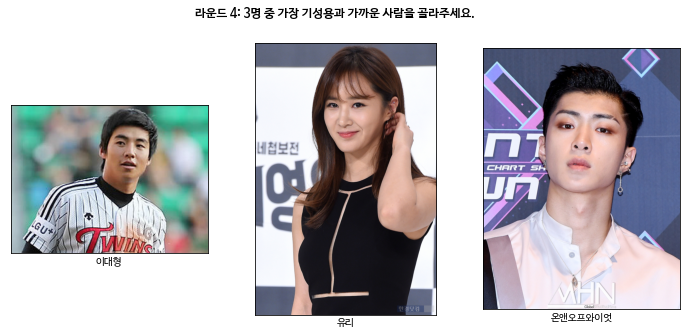

정답이라고 생각되는 이름을 정확히 입력해주세요.이대형
오답입니다... 정답: 유리


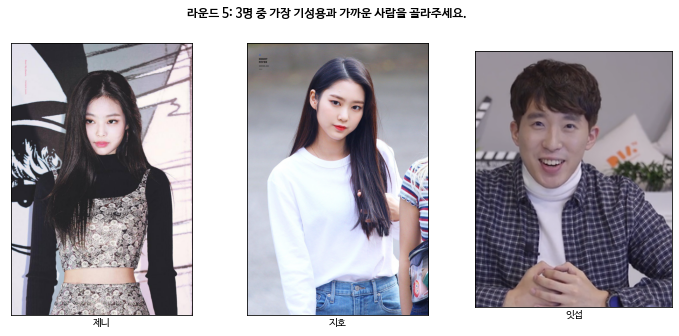

정답이라고 생각되는 이름을 정확히 입력해주세요.잇섭
오답입니다... 정답: 제니


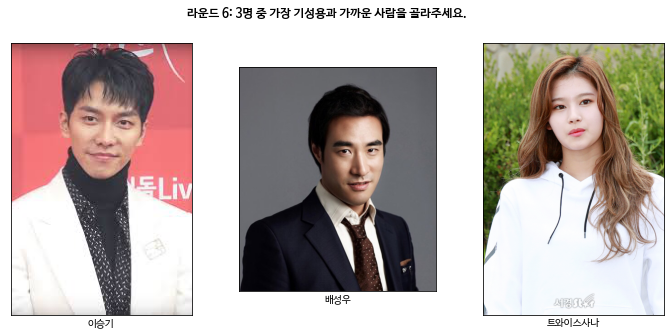

정답이라고 생각되는 이름을 정확히 입력해주세요.트와이스사나
오답입니다... 정답: 배성우


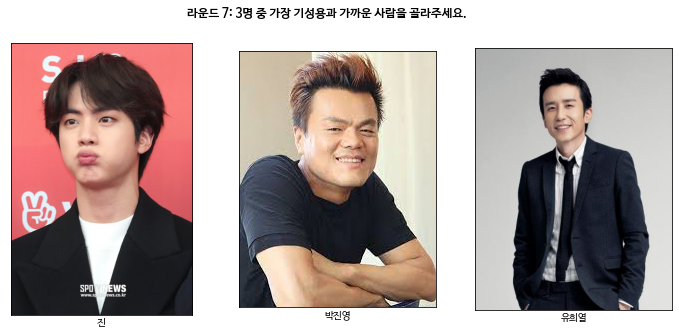

정답이라고 생각되는 이름을 정확히 입력해주세요.진
오답입니다... 정답: 박진영


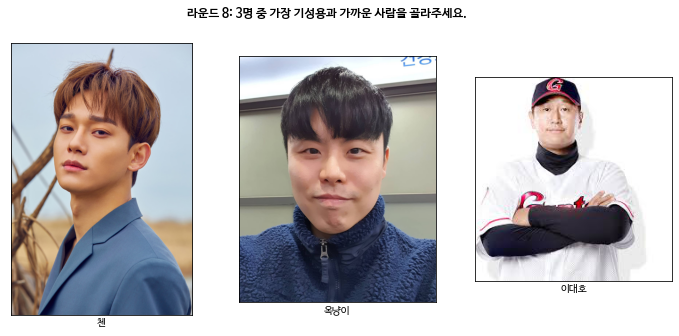

정답이라고 생각되는 이름을 정확히 입력해주세요.옥냥이
오답입니다... 정답: 첸
게임이 끝났습니다. 최종 스코어는 1점 입니다


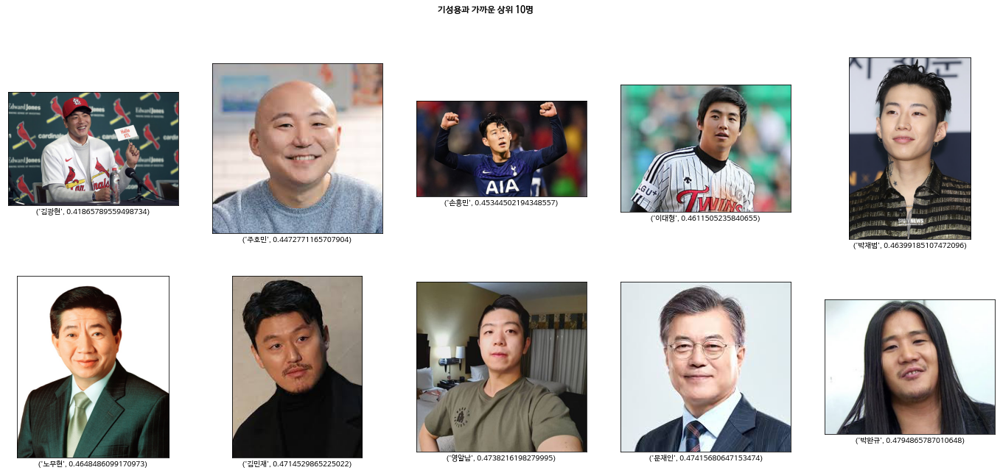

In [ ]:
game_ki.play()

In [ ]:
game_irene = GuessingGame('아이린', closest=False)

NameError: ignored

게임 시작


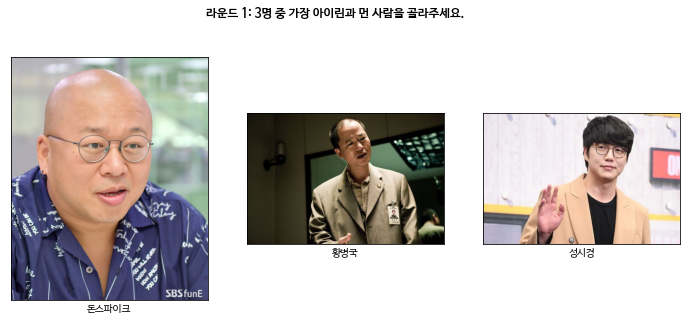

정답이라고 생각되는 이름을 정확히 입력해주세요.황병국
오답입니다... 정답: 돈스파이크


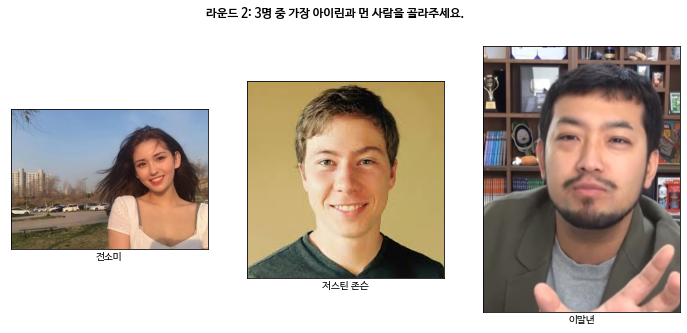

정답이라고 생각되는 이름을 정확히 입력해주세요.전소미
오답입니다... 정답: 저스틴 존슨


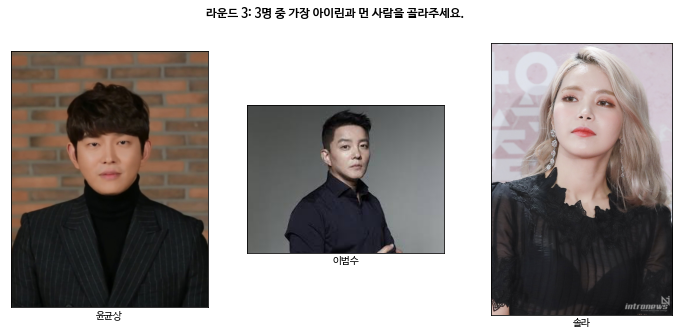

정답이라고 생각되는 이름을 정확히 입력해주세요.윤균상
오답입니다... 정답: 솔라


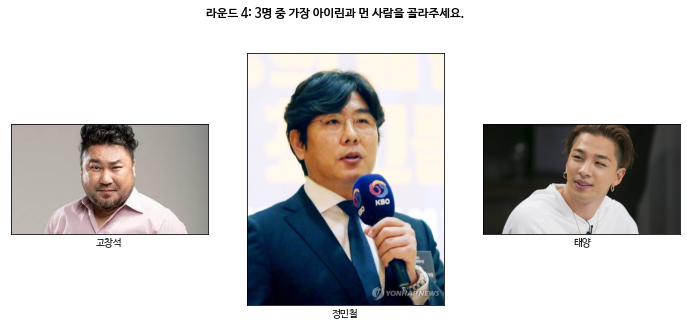

정답이라고 생각되는 이름을 정확히 입력해주세요.고창석
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 1.


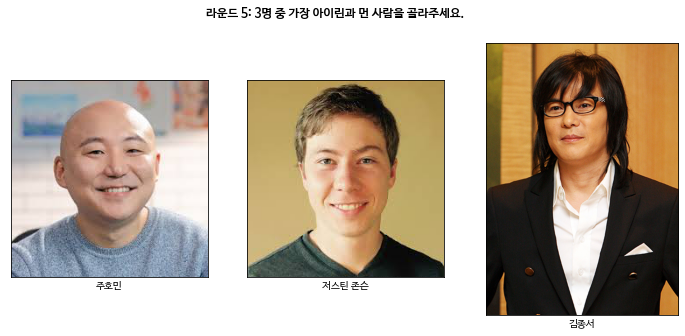

정답이라고 생각되는 이름을 정확히 입력해주세요.저스틴 존슨
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 2.


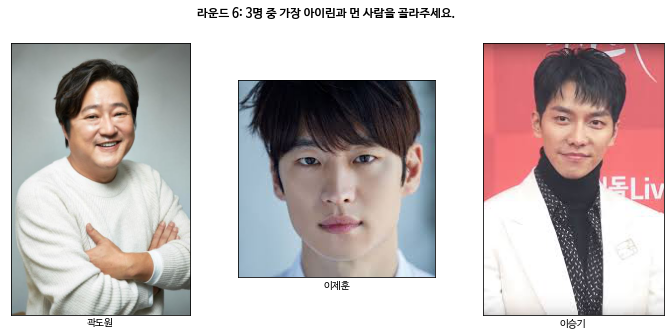

정답이라고 생각되는 이름을 정확히 입력해주세요.곽도원
오답입니다... 정답: 이승기


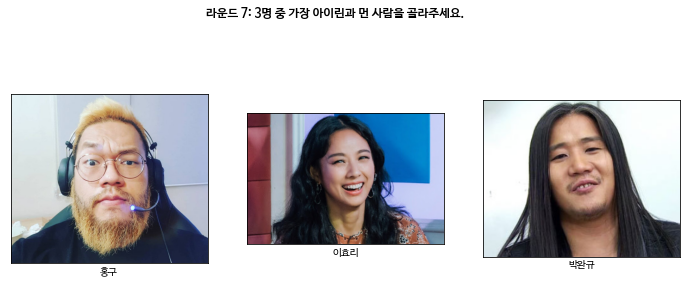

정답이라고 생각되는 이름을 정확히 입력해주세요.홍구
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 3.


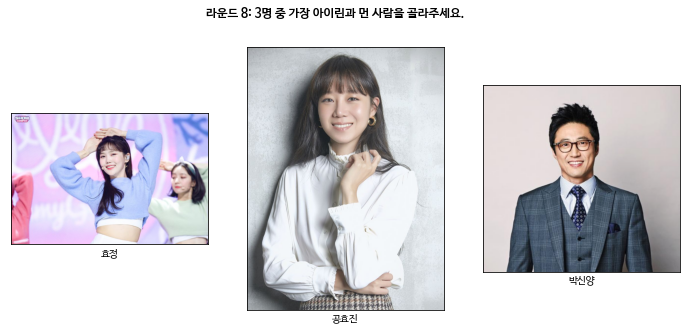

정답이라고 생각되는 이름을 정확히 입력해주세요.박신양
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 4.
게임이 끝났습니다. 최종 스코어는 4점 입니다


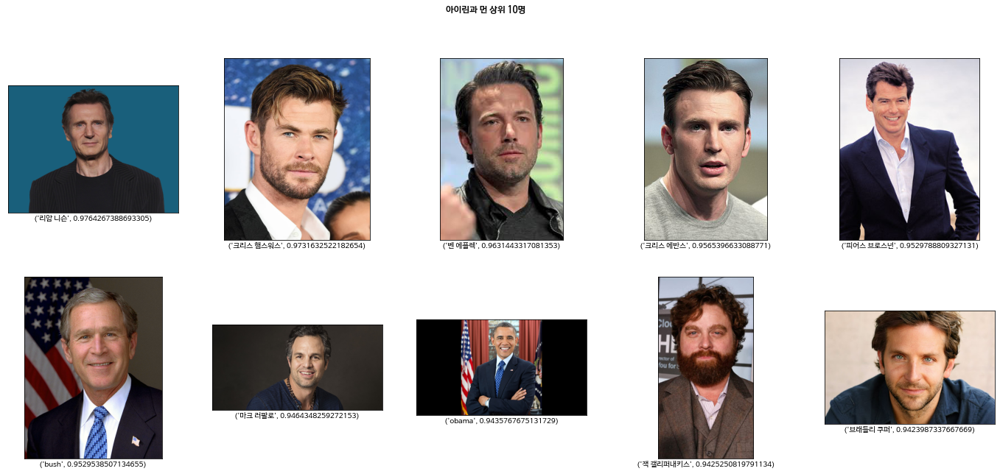

In [ ]:
game_irene.play()

박완규과 가까운 사람 맞추기 게임이 준비되었습니다. (8 라운드)
시작하시려면 .play()를 실행하세요


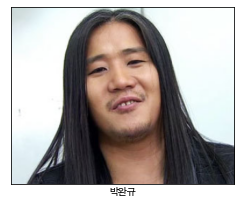

In [ ]:
game_park = GuessingGame('박완규')

게임 시작


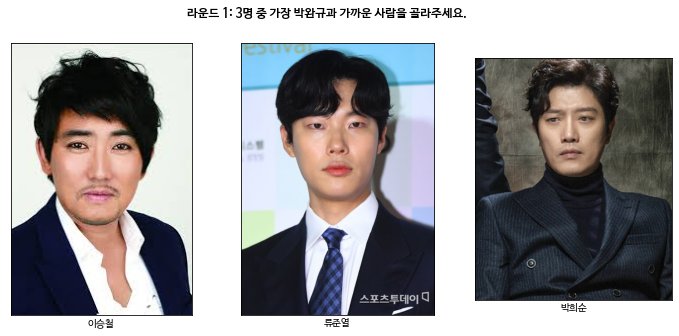

정답이라고 생각되는 이름을 정확히 입력해주세요.이승철
오답입니다... 정답: 류준열


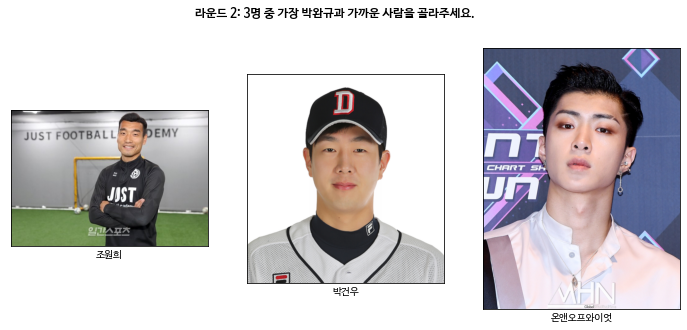

정답이라고 생각되는 이름을 정확히 입력해주세요.박건우
오답입니다... 정답: 조원희


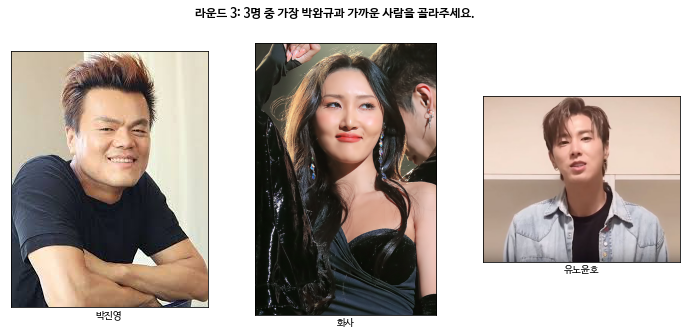

정답이라고 생각되는 이름을 정확히 입력해주세요.유노윤호
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 1.


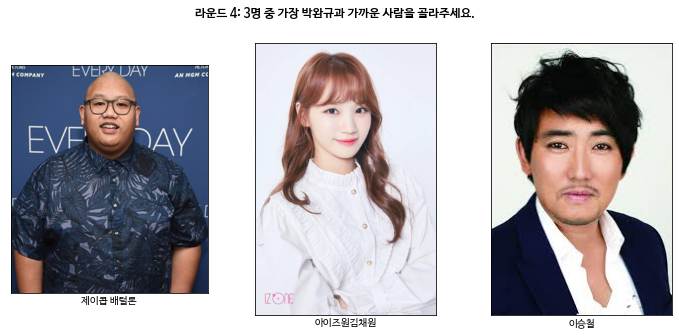

정답이라고 생각되는 이름을 정확히 입력해주세요.아이즈원김채원
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 2.


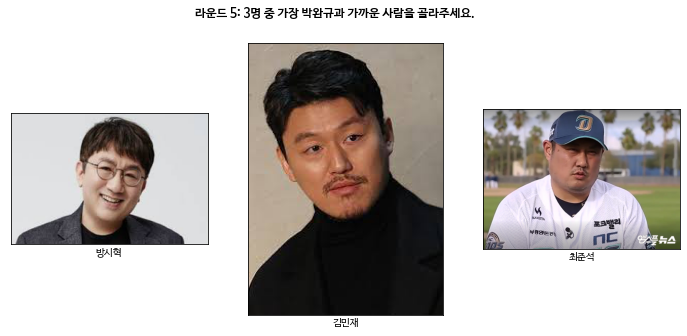

정답이라고 생각되는 이름을 정확히 입력해주세요.방시혁
오답입니다... 정답: 김민재


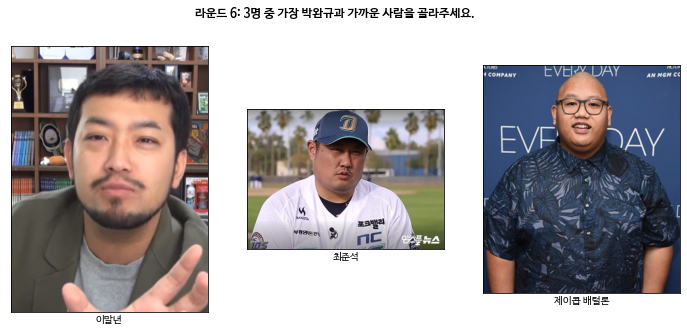

정답이라고 생각되는 이름을 정확히 입력해주세요.제이콥 배럴론
오답입니다... 정답: 이말년


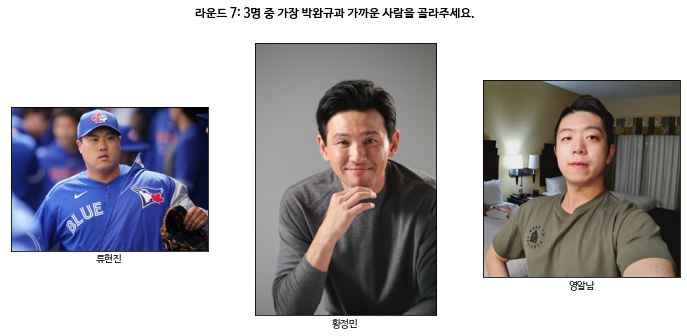

정답이라고 생각되는 이름을 정확히 입력해주세요.영알남
오답입니다... 정답: 류현진


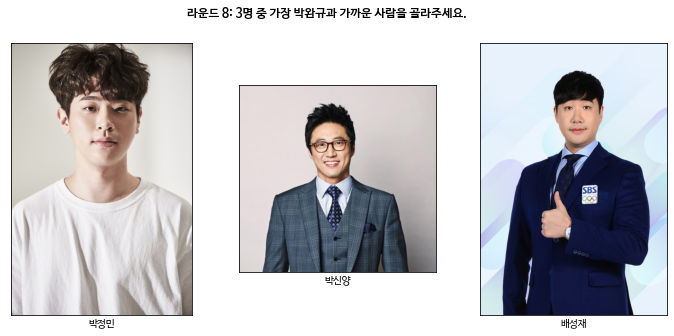

정답이라고 생각되는 이름을 정확히 입력해주세요.박정민
오답입니다... 정답: 박신양
게임이 끝났습니다. 최종 스코어는 2점 입니다


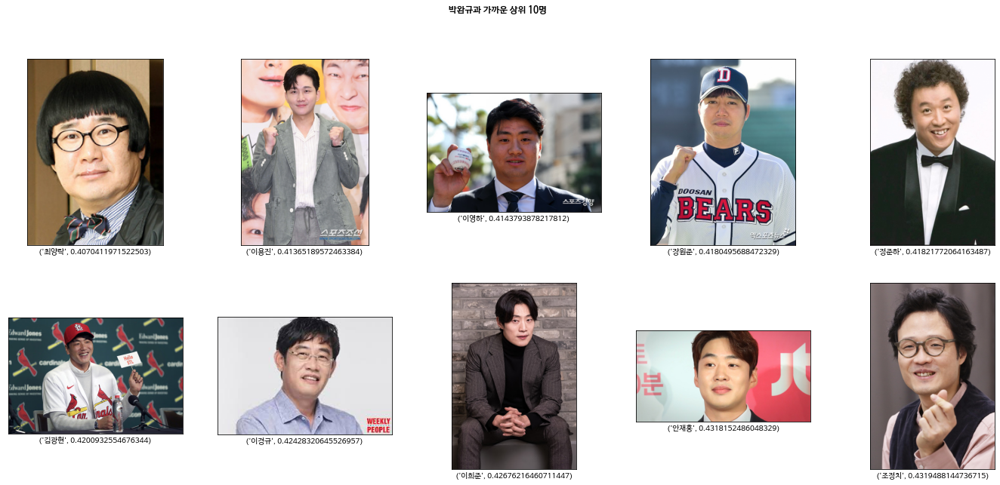

In [ ]:
game_park.play()

In [ ]:
from time import sleep

#우측에 비교할 이미지를 표시한다
class GuessingGameV2():
    def __init__(self, name, *, rounds=8, closest=True):
        self.__cand_list = None
        self.__rank = None
        self.__point = None

        self.closest = closest
        self.name = name
        self.filename = mapping[name]
        self.rounds = rounds
        mode_list = ["먼", "가까운"]
        self.mode = mode_list[closest]
        
        fig_0, ax_0 = plt.subplots(figsize=(4,5))
        ax_0.axes.xaxis.set_ticks([])
        ax_0.axes.yaxis.set_ticks([])
        plt.xlabel(name)

        
        image_path = img.imread(os.path.join(dir_path, self.filename),0)  # png
        ax_0.imshow(image_path)
        print(f"{name}과 {self.mode} 사람 맞추기 게임이 준비되었습니다. ({rounds} 라운드)")
        print("시작하시려면 .play()를 실행하세요")
        self.earn_point()

    def play(self):
        self.set_val()

        print(f"게임 시작")
        for i in range(1, self.rounds+1):
            fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16,5))
            candidates = self.get_val(i)
            for j, ax in enumerate(axes.flatten()):
                ax.axes.xaxis.set_ticks([])
                ax.axes.yaxis.set_ticks([])
                if j != 3:
                    ax.set_xlabel(f"{candidates[j][0]}")
                    img_path = mapping[candidates[j][0]]
                else:
                    ax.set_xlabel(f"{self.name}")
                    img_path = self.filename
                image_path = img.imread(os.path.join(dir_path, img_path),0)  # png
                ax.imshow(image_path)
            plt.suptitle(f"라운드 {i}: 3명 중 가장 {self.name}과 {self.mode} 사람을 골라주세요.", fontweight="bold")
            plt.show()
            sleep(8)
            
            picked = input("정답이라고 생각되는 이름을 정확히 입력해주세요.")
            correct = sorted(candidates, key=lambda candidates: -candidates[1])[0][0]
            if picked == correct:
                print("정답입니다. 포인트 1점을 얻으셨습니다.")
                self.earn_point()
                print(f"현재 포인트: {self.__point}.")
            else: 
                print(f"오답입니다... 정답: {correct}")

        # 게임 끝
        print(f'게임이 끝났습니다. 최종 스코어는 {self.__point}점 입니다')
        plot_closest_mod(self.__leaderboard, (self.name, self.mode))
        
    def set_val(self):
        self.__cand_list = np.random.randint(1, 201 , (self.rounds,3))
        self.__rank = get_nearest_face_mod(name=self.name, top=200, closest=self.closest)
        self.__leaderboard = self.__rank[:10]

    def get_val(self, cur_round):
        cands = []
        for i in range(3):
            cands.append(self.__rank[self.__cand_list[cur_round-1][i]])
        return cands

    def earn_point(self):
        if self.__point == None:
            self.__point = 0
        else:
            self.__point += 1

기성용과 가까운 사람 맞추기 게임이 준비되었습니다. (3 라운드)
시작하시려면 .play()를 실행하세요


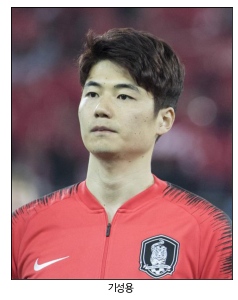

In [ ]:
game_v2_ki = GuessingGameV2('기성용', rounds=3)

게임 시작


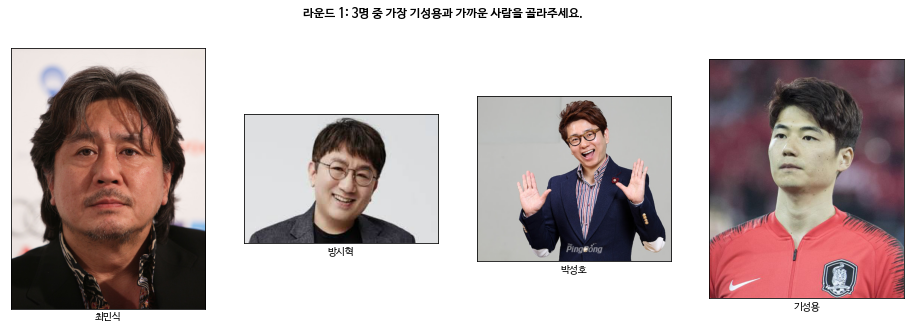

정답이라고 생각되는 이름을 정확히 입력해주세요.방시혁
오답입니다... 정답: 최민식


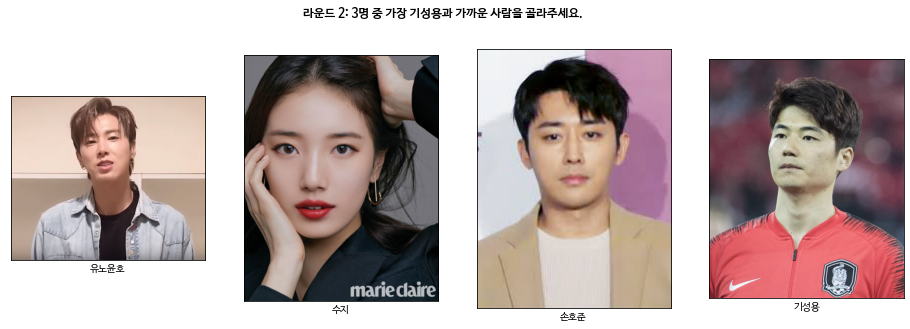

정답이라고 생각되는 이름을 정확히 입력해주세요.손호준
오답입니다... 정답: 유노윤호


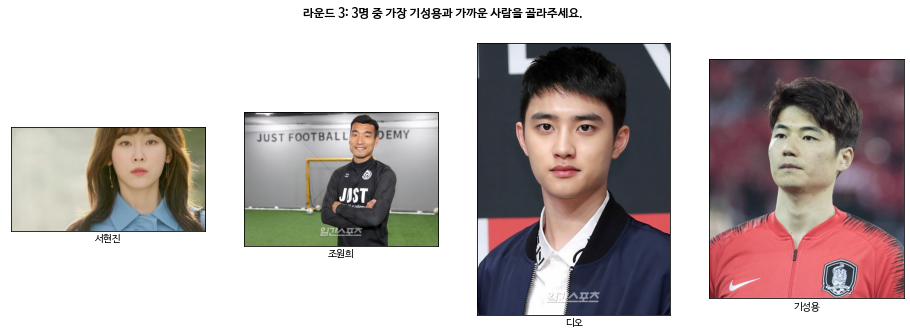

정답이라고 생각되는 이름을 정확히 입력해주세요.조원희
오답입니다... 정답: 서현진
게임이 끝났습니다. 최종 스코어는 0점 입니다


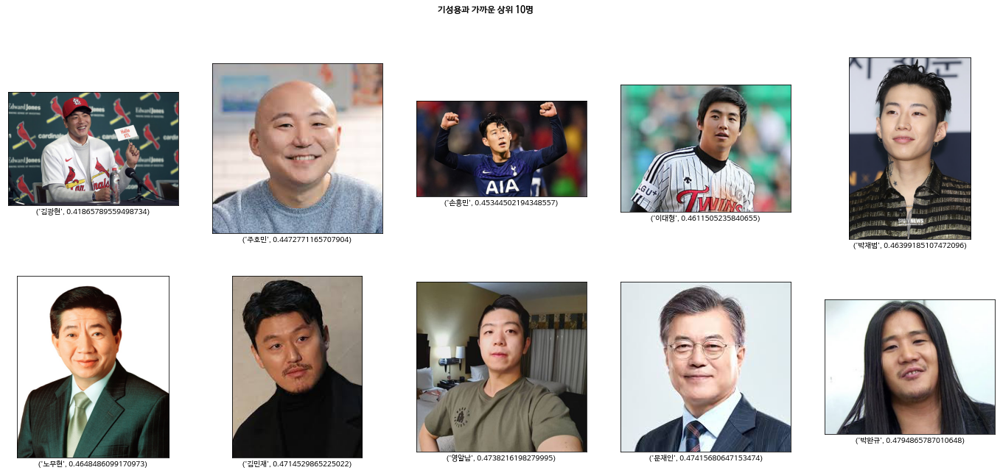

In [ ]:
game_v2_ki.play()

장도연과 가까운 사람 맞추기 게임이 준비되었습니다. (3 라운드)
시작하시려면 .play()를 실행하세요


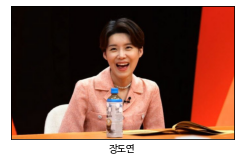

In [ ]:
game_jdy = GuessingGameV2('장도연', rounds=3)

게임 시작


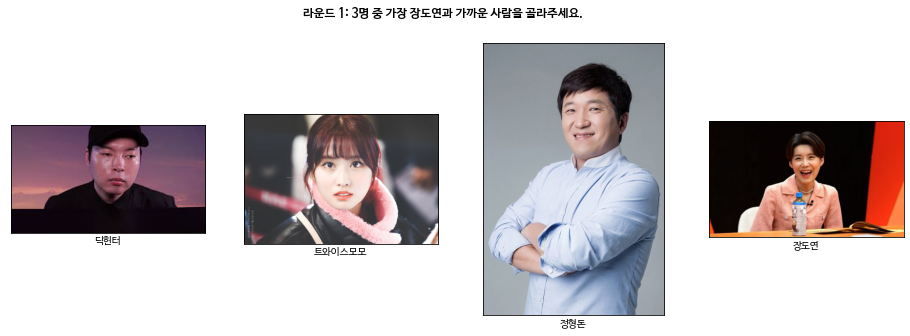

정답이라고 생각되는 이름을 정확히 입력해주세요.정형돈
오답입니다... 정답: 딕헌터


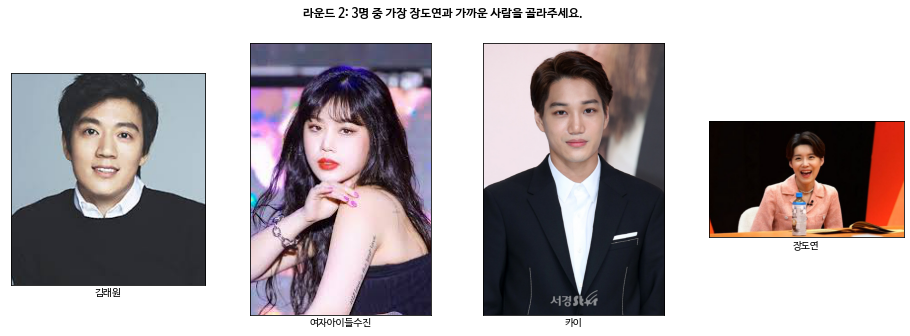

정답이라고 생각되는 이름을 정확히 입력해주세요.김래원
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 1.


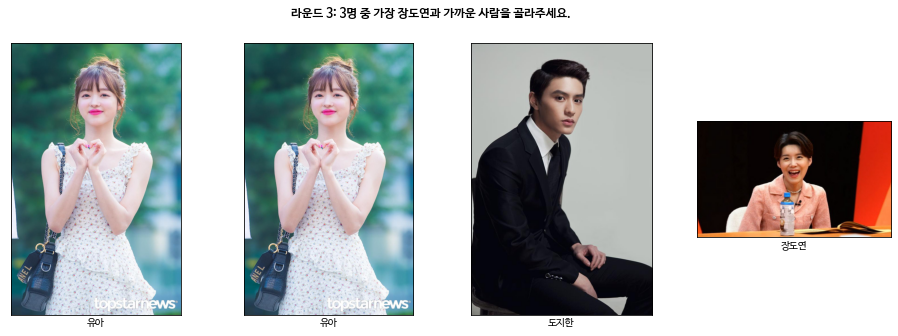

정답이라고 생각되는 이름을 정확히 입력해주세요.도지한
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 2.
게임이 끝났습니다. 최종 스코어는 2점 입니다


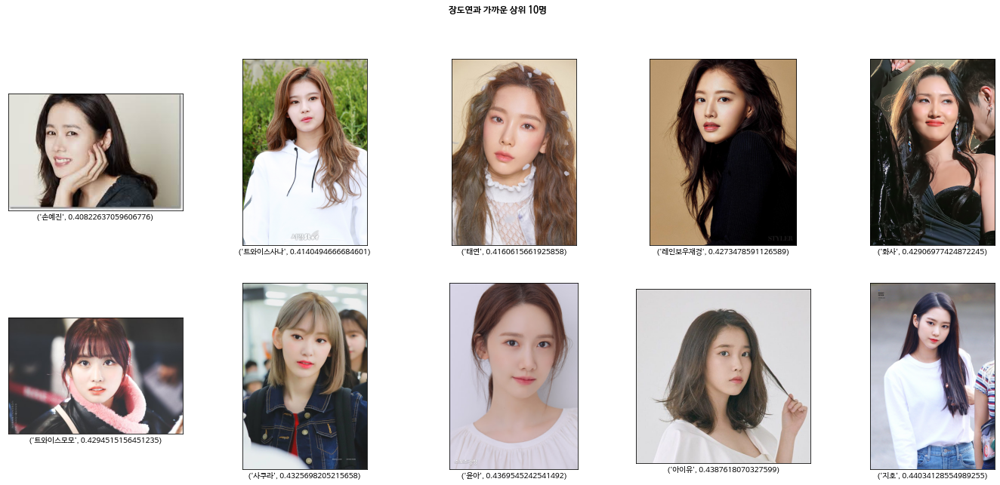

In [ ]:
game_jdy.play()

## 같은 사람이 여러 번 선택되는 경우도 있고, 정답률이 너무 낮은게 오류가 의심된다.

->정답을 추출해내는 과정에서 먼 사람을 고르는 상황인지, 가까운 사람을 고르는 상황인지와 관계없이 가장 먼 사람이 선택되는 문제를 발견하여 V3에서 수정했다. 또한 비복원추출로 변경한다.

In [41]:
# x, y축 틱을 없애고, 이름을 표시한다.

def plot_closest(leaderboard, title):
    # Set figsize here
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24,10))

    # flatten axes for easy iterating
    for i, ax in enumerate(axes.flatten()):
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])
        ax.set_xlabel(f"{i+1}등: {leaderboard[i][0]},  거리: {leaderboard[i][1]}")
        image = mapping[leaderboard[i][0]]
        image_path = img.imread(os.path.join(dir_path, image),0)  # png
        ax.imshow(image_path)

    plt.suptitle(f"{title[0]}와(과) {title[1]} 상위 10명", fontweight="bold")
    plt.show()
    fig.tight_layout()

In [47]:
from time import sleep

#우측에 비교할 이미지를 표시한다.
#비복원추출로 변경한다.
#정답을 골라내는데 문제가 있어 수정했다.
class GuessingGameV3():
    def __init__(self, name, *, rounds=8, closest=True):
        self.__cand_list = None
        self.__rank = None
        self.__point = None
        self.__leaderboard = None

        self.closest = closest
        self.name = name
        self.filename = mapping[name]
        self.rounds = rounds
        mode_list = ["먼", "가까운"]
        self.mode = mode_list[closest]
        
        fig, ax = plt.subplots(figsize=(4,5))
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])
        plt.xlabel(name)

        image_path = img.imread(os.path.join(dir_path, self.filename),0)  # png
        ax.imshow(image_path)
        print(f"{name}와(과) {self.mode} 사람 맞추기 게임이 준비되었습니다. ({rounds} 라운드)")
        print("시작하시려면 .play()를 실행하세요")
        self.earn_point()

    def play(self):
        self.set_val()

        print(f"게임 시작")
        for cur_round in range(1, self.rounds+1):
            self.__round_cand_list = None
            self.__correct = None

            self.__round_cand_list = self.get_val(cur_round)
            self.plot_candidates(cur_round)
            
            print("정답이라고 생각되는 이름을 정확히 입력해주세요.")
            picked = input("당신의 선택: --------->")
            
            self.__correct = self.get_correct_answer(self.closest, self.__round_cand_list)

            if picked == self.__correct:
                print("정답입니다. 포인트 1점을 얻으셨습니다.")
                self.earn_point()
                print(f"현재 포인트: {self.get_point()}.")
            else: 
                print(f"오답입니다... 정답: {self.__correct}")
                print(f"현재 포인트: {self.get_point()}.")

        # 게임 끝
        print(f'게임이 끝났습니다. 최종 스코어는 {self.get_point()}점 입니다')
        plot_closest(self.__leaderboard, (self.name, self.mode)) # 변경

    def get_correct_answer(self, closest, round_cand_list):
        if closest: return sorted(round_cand_list, key=lambda round_cand_list: round_cand_list[1])[0][0]
        else: return sorted(round_cand_list, key=lambda round_cand_list: -round_cand_list[1])[0][0]

    def plot_candidates(self, cur_round):
        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16,5))
        for j, ax in enumerate(axes.flatten()):
            ax.axes.xaxis.set_ticks([])
            ax.axes.yaxis.set_ticks([])
            if j != 3:
                ax.set_xlabel(f"{self.__round_cand_list[j][0]}")
                img_path = mapping[self.__round_cand_list[j][0]]
            else:
                ax.set_xlabel(f"{self.name}")
                img_path = self.filename
            image_path = img.imread(os.path.join(dir_path, img_path),0)  # png
            ax.imshow(image_path)
        plt.suptitle(f"라운드 {cur_round}:   3명 중 가장 {self.name}와(과) {self.mode} 사람을 골라주세요.", fontweight="bold")
        plt.show()
        sleep(4)
        
    def set_val(self):
        # self.__cand_list = np.random.randint(1, 201 , (self.rounds,3))
        self.__cand_list = np.random.choice(200, size=(self.rounds,3), replace=False )
        self.__rank = get_nearest_face_mod(name=self.name, top=200, closest=self.closest)
        self.__leaderboard = self.__rank[:10]

    def get_val(self, cur_round):
        cands = []
        for i in range(3):
            cands.append(self.__rank[self.__cand_list[cur_round-1][i]])
        return cands

    def earn_point(self):
        if self.__point == None:
            self.__point = 0
        else:
            self.__point += 1
    
    def get_point(self):
        return self.__point

지호와(과) 먼 사람 맞추기 게임이 준비되었습니다. (2 라운드)
시작하시려면 .play()를 실행하세요


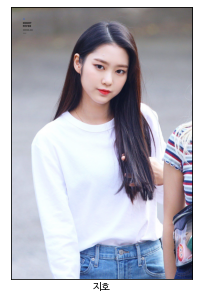

In [43]:
game_jiho = GuessingGameV3('지호', rounds=2, closest=False)

게임 시작


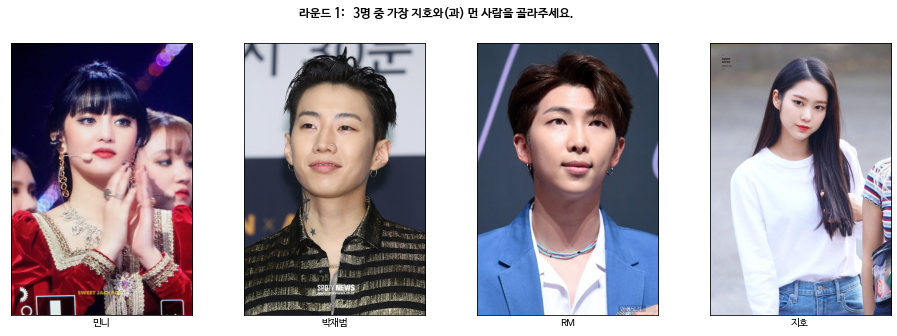

정답이라고 생각되는 이름을 정확히 입력해주세요.
당신의 선택: --------->RM
오답입니다... 정답: 민니
현재 포인트: 0.


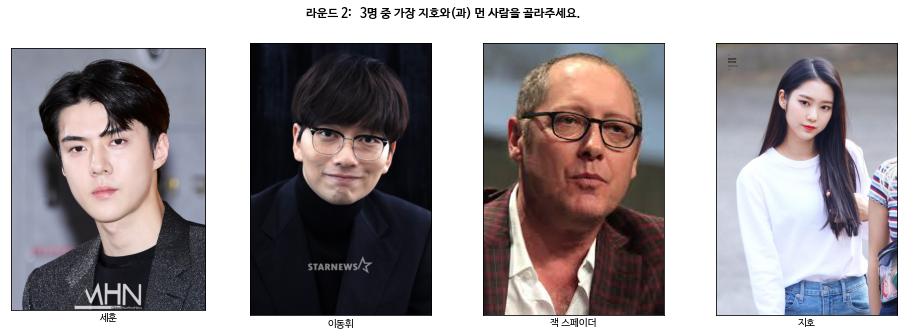

정답이라고 생각되는 이름을 정확히 입력해주세요.
당신의 선택: --------->잭 스페이더
정답입니다. 포인트 1점을 얻으셨습니다.
현재 포인트: 1.
게임이 끝났습니다. 최종 스코어는 1점 입니다


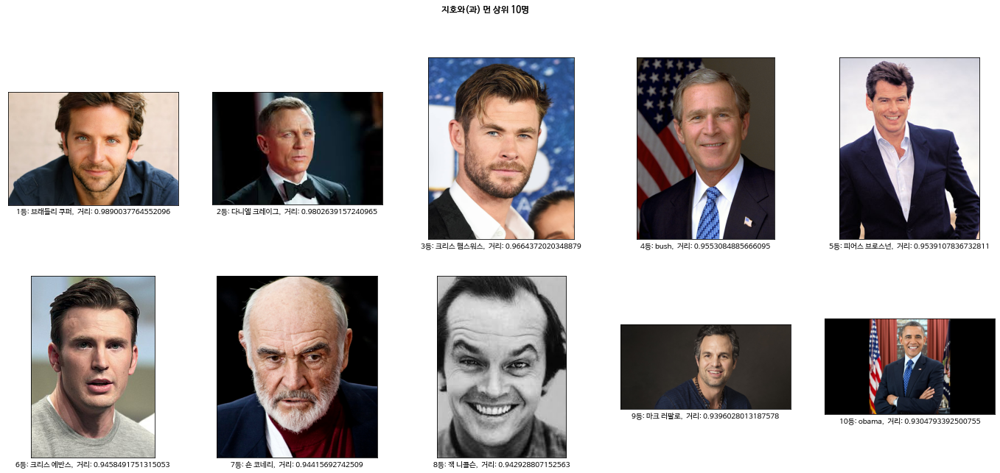

In [44]:
game_jiho.play()

류현진와(과) 가까운 사람 맞추기 게임이 준비되었습니다. (2 라운드)
시작하시려면 .play()를 실행하세요


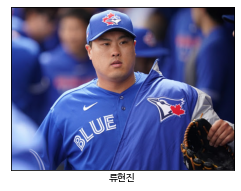

In [48]:
game_ryu = GuessingGameV3('류현진', rounds=2)

게임 시작


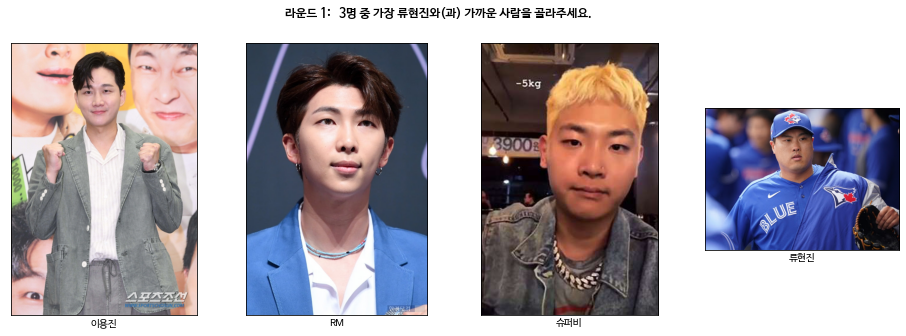

정답이라고 생각되는 이름을 정확히 입력해주세요.
당신의 선택: --------->이용진
오답입니다... 정답: RM
현재 포인트: 0.


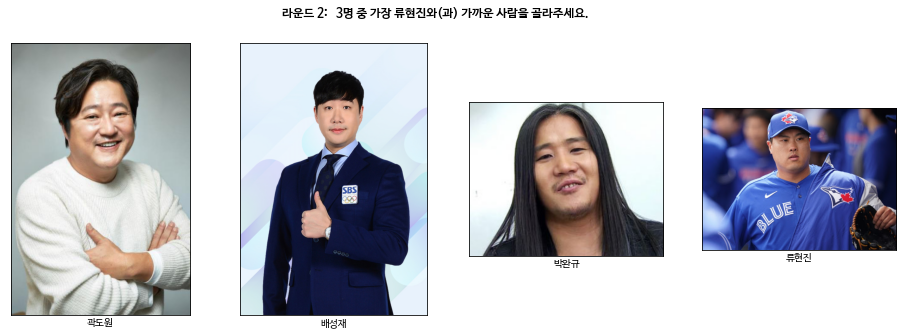

정답이라고 생각되는 이름을 정확히 입력해주세요.
당신의 선택: --------->박완규
오답입니다... 정답: 배성재
현재 포인트: 0.
게임이 끝났습니다. 최종 스코어는 0점 입니다


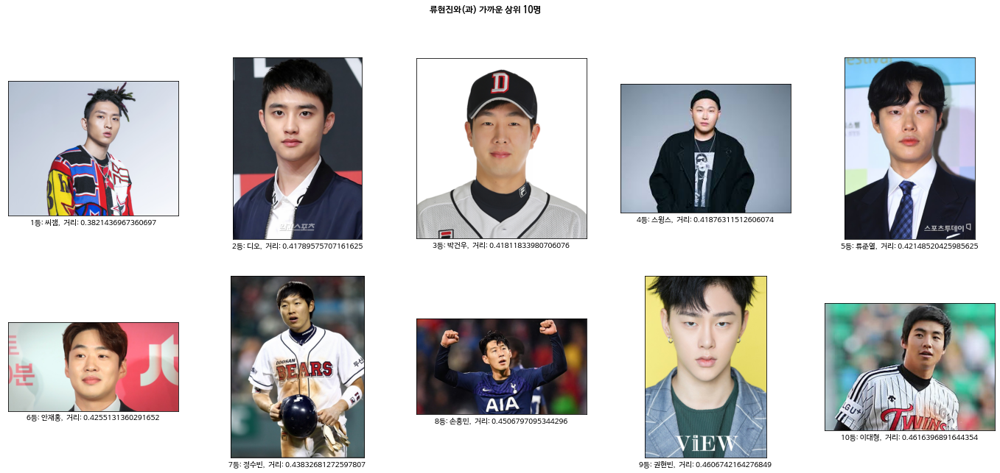

In [49]:
game_ryu.play()

## 류현진의 경우, 씨잼과의 거리가 0.38로 가장 가까워, 가장 닮은 연예인은 씨잼이다.

# 회고

1. 게임으로 무엇인가를 만들어 내는 것은 쉽지 않았다. 이렇게 비교적 간단한 동작도 머리가 아픈데, 조금이라도 더 복잡해졌다가는 팀원끼리도 절대 이해 못할 것이다. 더욱 친절한 docstring과 클린 코드짜기에 심혈을 기울여야 할 것 같다.

2. 임베딩 벡터 간의 거리가 사람들이 생각하는 직관과 차이가 어느정도 있는 것 같다. 가장 먼 경우를 뽑아봤을 때, 외국인이 많이 나오는 걸로 보아, 인종적인 차이가 큰 영향을 주는 것 같다. 

3. 2와 같이 생각했던 이유는 정답과 순위를 도출하는 코드에 오류가 있었던 것이 원인으로, 스스로를 위해서라도 더욱 친절한 코드를 짜야 한다는 생각이 들었다 